In [1]:
import pickle
import numpy as np

In [15]:
import pickle
import numpy as np
x = pickle.load( open( "../classification/metadata/BrU_3cls_0.pkl", "rb" ) )
max_thresh = x['_metadata']['max_thresh']

In [3]:
patient_ids = []
preds = []
trues = []
reals = []
confs = []
embeddings = []
for i in x:
    if(i == '_metadata'): continue
    patient_id = i[:3]
    pred_class = 0 if x[i]['pred_conf'][0] > max_thresh else 1 
    true_class = x[i]['true_class']
    real_class = x[i]['real_class']

    patient_ids.append(patient_id)
    
    preds.append(pred_class)
    trues.append(true_class)
    reals.append(real_class)
    confs.append(x[i]['pred_conf'][0])
    embeddings.append(x[i]['embedding'])
patient_ids = np.array(patient_ids)
preds = np.array(preds)
trues = np.array(trues)
reals = np.array(reals)
confs = np.array(confs)

embeddings = np.array(embeddings)

In [4]:
import umap.umap_ as umap
reducer = umap.UMAP(n_neighbors = 15, random_state=140, min_dist = 0.2)
transformed_embeddings = reducer.fit_transform(embeddings)

In [5]:
tp_loc = np.where((preds == 0) & (trues == 0))
fp_loc = np.where((preds == 0) & (trues != 0))
fn_loc = np.where((preds >= 1) & (trues == 0))
tn_loc = np.where((preds >= 1) & (trues >= 1))

In /home/schwan/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/schwan/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/schwan/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /home/schwan/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/schwan/miniconda3/lib/python3.7/site-packages/m

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


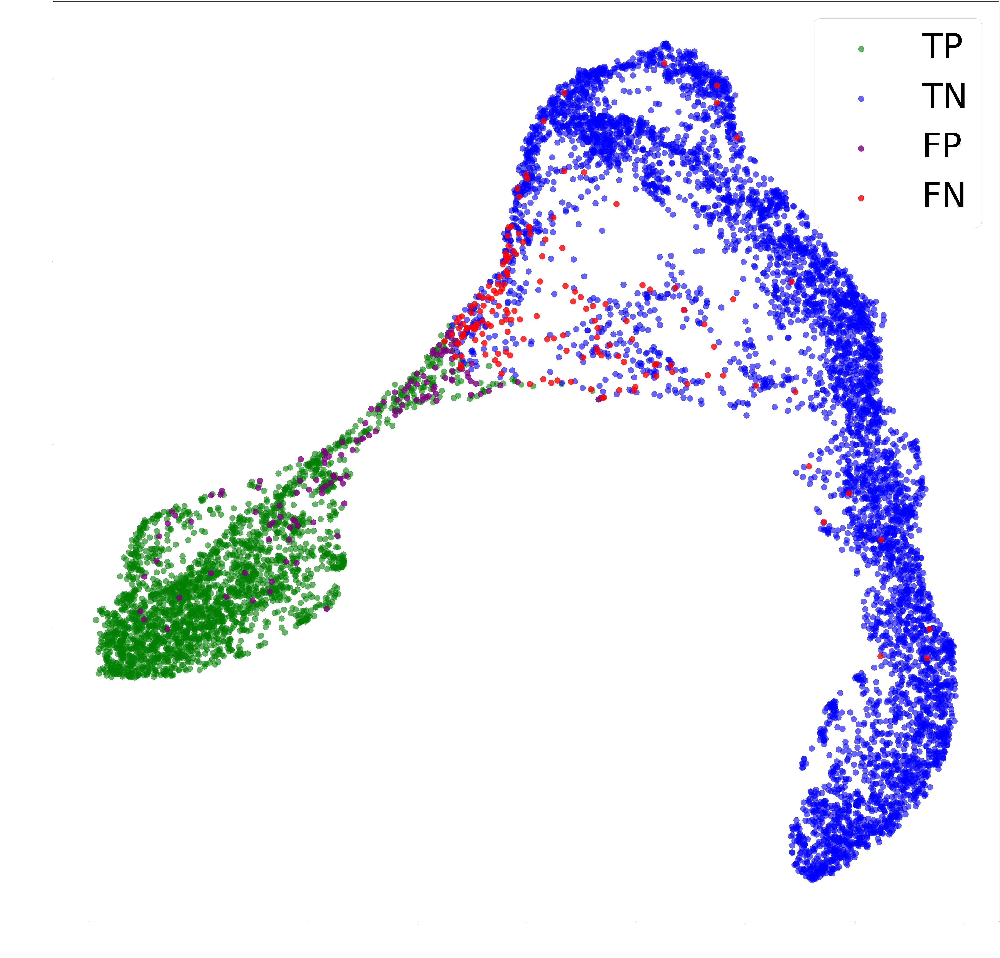

In [6]:
import matplotlib.pyplot as plt
import matplotlib
font = {'family' : 'normal',
        'size'   : 160}

matplotlib.rc('font', **font)

plt.figure(figsize = (80, 80))
plt.xticks(color='w')
plt.yticks(color='w')

# plt.scatter(transformed_embeddings[:, 0], transformed_embeddings[:, 1], alpha = 0.4, s = 16, color = 'blue')
plt.scatter(transformed_embeddings[tp_loc][:, 0], transformed_embeddings[tp_loc][:, 1], alpha = 0.6, s = 96 * 8, color = 'green', label = 'TP')
plt.scatter(transformed_embeddings[tn_loc][:, 0], transformed_embeddings[tn_loc][:, 1], alpha = 0.6, s = 96 * 8, color = 'blue', label = 'TN')
plt.scatter(transformed_embeddings[fp_loc][:, 0], transformed_embeddings[fp_loc][:, 1], alpha = 0.8, s = 96 * 8, color = 'purple', label = 'FP')
plt.scatter(transformed_embeddings[fn_loc][:, 0], transformed_embeddings[fn_loc][:, 1], alpha = 0.8, s = 96 * 8, color = 'red', label = 'FN')
plt.legend()

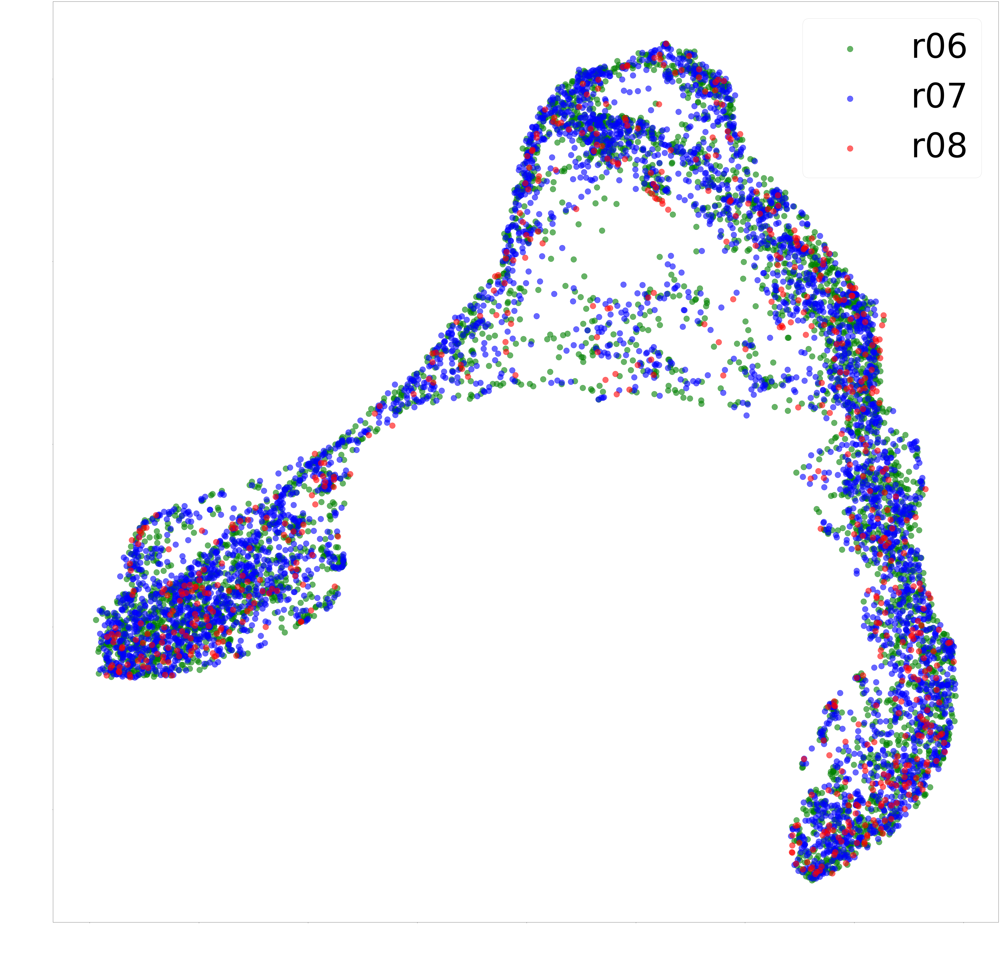

In [7]:
r6_loc = np.where(patient_ids == 'r06')
r7_loc = np.where(patient_ids == 'r07')
r8_loc = np.where(patient_ids == 'r08')
plt.figure(figsize = (80, 80))
plt.xticks(color='w')
plt.yticks(color='w')

# plt.scatter(transformed_embeddings[:, 0], transformed_embeddings[:, 1], alpha = 0.4, s = 16, color = 'blue')
plt.scatter(transformed_embeddings[r6_loc][:, 0], transformed_embeddings[r6_loc][:, 1], alpha = 0.6, s = 96 * 8, color = 'green', label = 'r06')
plt.scatter(transformed_embeddings[r7_loc][:, 0], transformed_embeddings[r7_loc][:, 1], alpha = 0.6, s = 96 * 8, color = 'blue', label = 'r07')
plt.scatter(transformed_embeddings[r8_loc][:, 0], transformed_embeddings[r8_loc][:, 1], alpha = 0.6, s = 96 * 8, color = 'red', label = 'r08')
plt.legend()

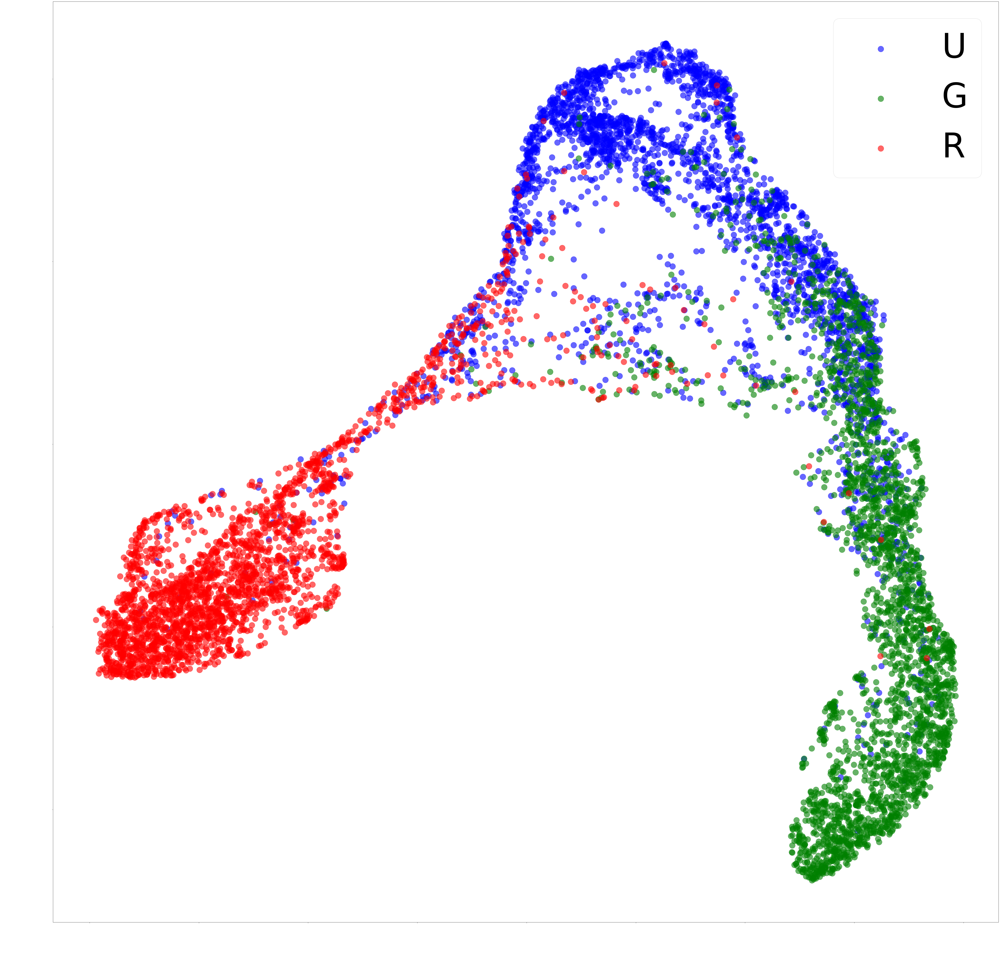

In [8]:
R_loc = np.where((reals == 'R'))
G_loc = np.where(reals == 'G')
U_loc = np.where(reals == 'U')
plt.figure(figsize = (80, 80))
plt.xticks(color='w')
plt.yticks(color='w')

# plt.scatter(transformed_embeddings[:, 0], transformed_embeddings[:, 1], alpha = 0.4, s = 16, color = 'blue')
plt.scatter(transformed_embeddings[U_loc][:, 0], transformed_embeddings[U_loc][:, 1], alpha = 0.6, s = 96 * 8, color = 'blue', label = 'U')
plt.scatter(transformed_embeddings[G_loc][:, 0], transformed_embeddings[G_loc][:, 1], alpha = 0.6, s = 96 * 8, color = 'green', label = 'G')
plt.scatter(transformed_embeddings[R_loc][:, 0], transformed_embeddings[R_loc][:, 1], alpha = 0.6, s = 96 * 8, color = 'red', label = 'R')

plt.legend()

In [9]:
import numpy as np
y = np.array([83.27, 83, 83.51])
print(y.mean(), y.std())

83.25999999999999 0.20832666655999857


<AxesSubplot:title={'center':'Brightfield + Fluorescence'}, xlabel='Prediction', ylabel='Ground Truth'>

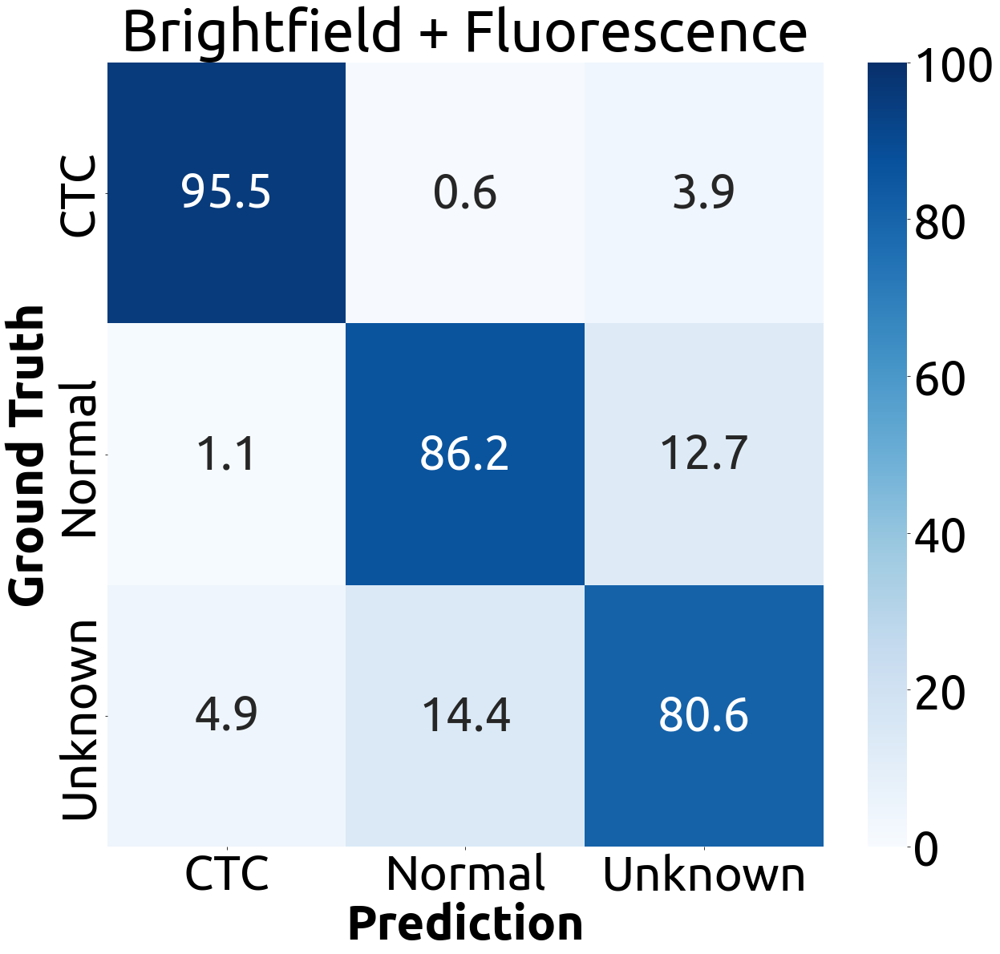

In [31]:
import pickle
import numpy as np
x = pickle.load( open( "../classification/metadata/BrFl_3cls_0.pkl", "rb" ) )
max_thresh = x['_metadata']['max_thresh']

confu = x['_metadata']['confusion_matrix']
norm_confu = np.around(confu / confu.sum(axis = 1).reshape(-1, 1), decimals = 4)

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
font = {'family' : 'Ubuntu',
#         'family' : 'normal',
        'size'   : 60,
        }
plt.rcParams['axes.labelweight'] = 'bold'

plt.figure(figsize = (20, 18))
plt.title('Brightfield + Fluorescence')
matplotlib.rc('font', **font)

s = sns.heatmap(100 * norm_confu, xticklabels= ['CTC', 'Normal', 'Unknown'], fmt='.1f', annot=True, cmap = "Blues", vmin=0, vmax=100)
s.set(xlabel='Prediction', ylabel='Ground Truth')
plt.yticks(np.arange(3)+0.5,('CTC', 'Normal', 'Unknown'),
           rotation=90, fontsize="60", va="center")
s